In [1]:
import h5py
from anndata._io.specs import read_elem
import numpy as np
import matplotlib.pyplot as plt

from PIL import Image

Image.MAX_IMAGE_PIXELS = 933120000

In [2]:
adata_path = f"/data/rajewsky/home/dleonpe/projects/openst_paper/data/2_downstream/fc_sts_63/auto_aligned_he/fc_sts_063_4_stitched_spots_aligned.h5ad"

In [3]:
with h5py.File(adata_path) as f:
    adata_spatial = read_elem(f["obsm/spatial_pairwise_aligned_coarse"])
    adata_counts = read_elem(f["obs/total_counts"])
    adata_tile = read_elem(f["obs/puck_id"])
    he_image_aligned = read_elem(f["uns/spatial_pairwise_aligned/staining_image_transformed"])

(-0.5, 1861.5, 1703.5403731829808, -0.5)

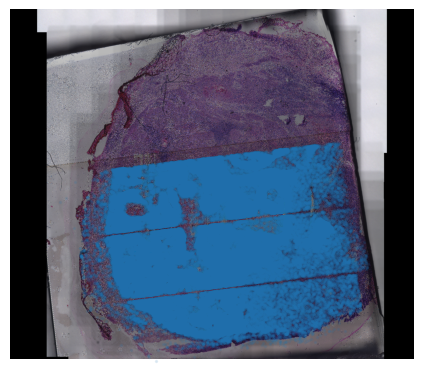

In [4]:
plt.imshow(he_image_aligned[::10,::10])
plt.scatter(adata_spatial[adata_counts > 10][::20, 0]*0.1, adata_spatial[adata_counts > 10][::20, 1]*0.1, s=2, alpha=0.1)
plt.axis("off")

In [5]:
with h5py.File(adata_path) as f:
    adata_spatial = read_elem(f["obsm/spatial_pairwise_aligned_fine"])

In [6]:
adata_spatial = np.clip(adata_spatial, 0, 20000)

(-0.5, 1861.5, 1769.0650000000003, -0.5)

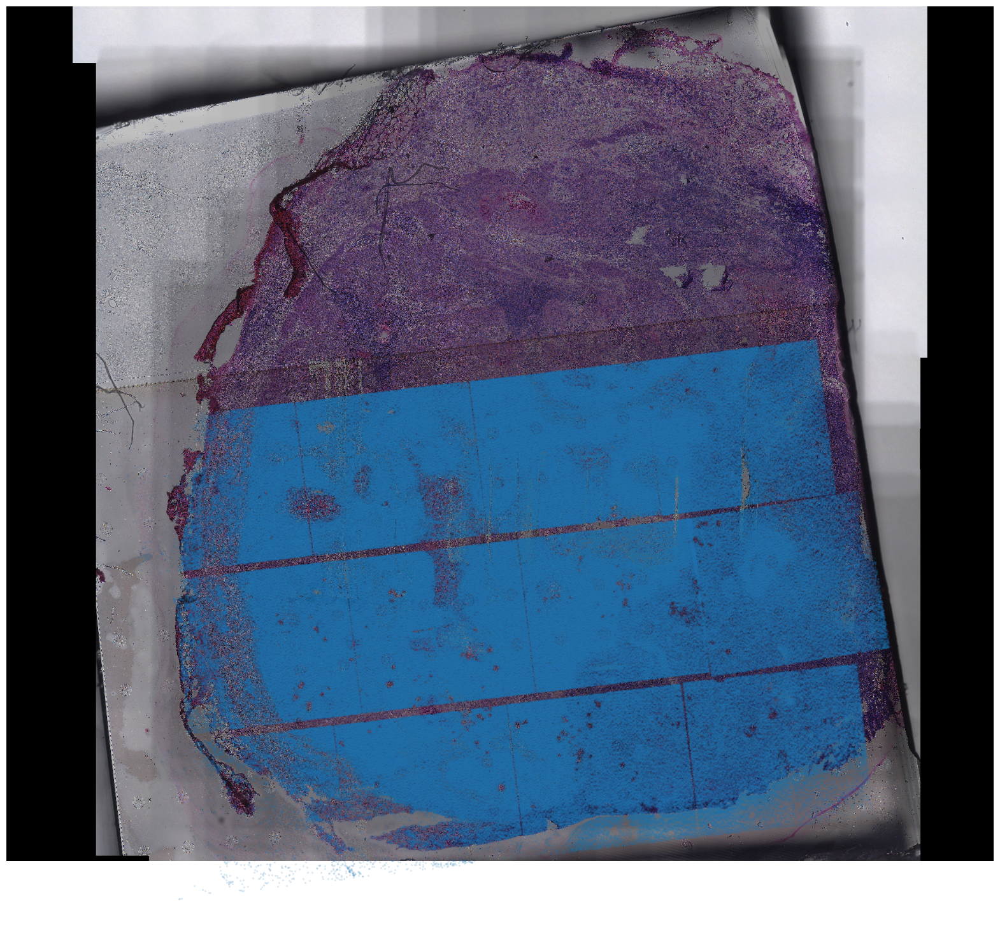

In [9]:
plt.figure(figsize=(20, 20))
plt.imshow(he_image_aligned[::10,::10])
plt.scatter(adata_spatial[adata_counts > 3][::20, 0]*0.1, adata_spatial[adata_counts > 3][::20, 1]*0.1, s=2, alpha=0.1)
plt.axis("off")

(-0.5, 1861.5, 1612.5, -0.5)

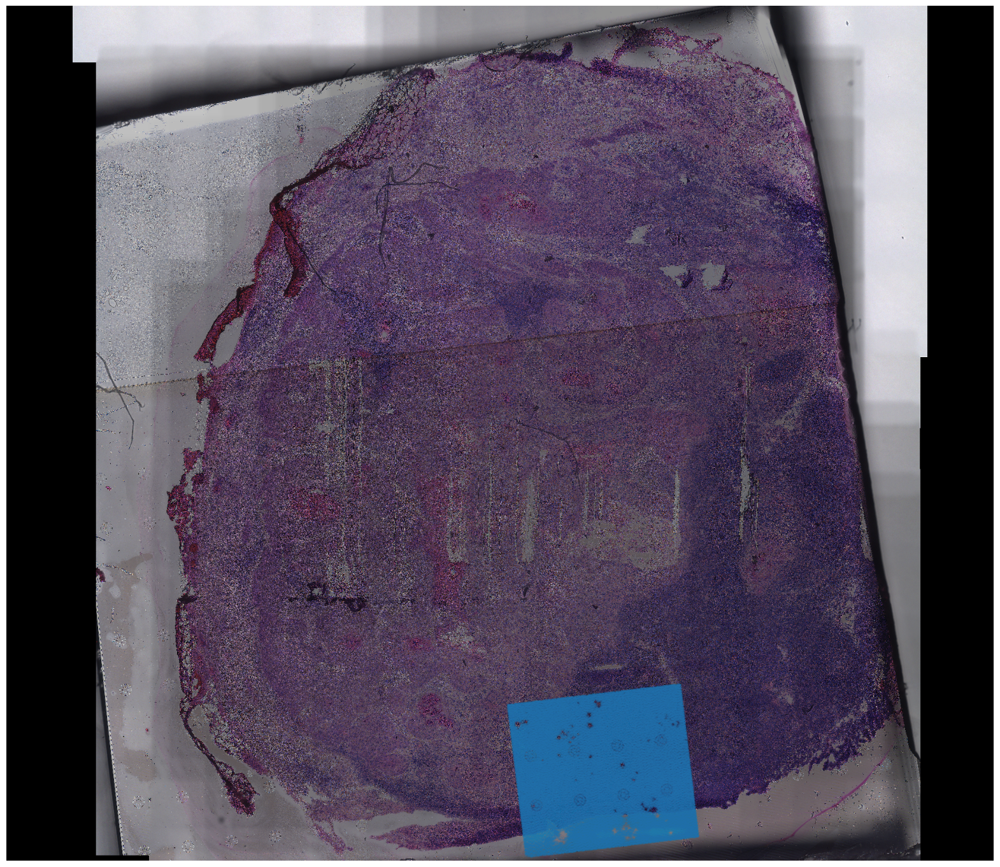

In [10]:
IDX_TILE = 10
plt.figure(figsize=(20, 20))
plt.imshow(he_image_aligned[::10,::10])
plt.scatter(adata_spatial[(adata_tile.codes == IDX_TILE)][::20, 0]*0.1, adata_spatial[(adata_tile.codes == IDX_TILE)][::20, 1]*0.1, s=2, alpha=0.1)
plt.axis("off")